# Modules

In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn.impute import KNNImputer 

In [4]:
from xgboost import XGBClassifier

In [5]:
from pandas_profiling import ProfileReport

In [6]:
%matplotlib inline

# Data

In [7]:
df_train = pd.read_csv('train.csv')

In [8]:
df_train.head(3)

,customer_id,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_affinity_score,customer_active_segment,X1,customer_category
0,csid_1,13.168425,9.447662,-0.070203,-0.139541,0.436956,4.705761,2.537985,7.959503,C,F,0
1,csid_2,17.092979,7.329056,0.153298,-0.102726,0.380340,4.205138,4.193444,17.517381,C,A,0
2,csid_3,17.505334,5.143676,0.106709,0.262834,0.417648,4.479070,3.878971,12.595155,C,BA,0


In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10738 entries, 0 to 10737
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       10738 non-null  object 
 1   customer_visit_score              10738 non-null  float64
 2   customer_product_search_score     10696 non-null  float64
 3   customer_ctr_score                10738 non-null  float64
 4   customer_stay_score               10701 non-null  float64
 5   customer_frequency_score          10738 non-null  float64
 6   customer_product_variation_score  10692 non-null  float64
 7   customer_order_score              10672 non-null  float64
 8   customer_affinity_score           10738 non-null  float64
 9   customer_active_segment           10715 non-null  object 
 10  X1                                10701 non-null  object 
 11  customer_category                 10738 non-null  int64  
dtypes: f

In [10]:
df_train.isna().sum()

customer_id                          0
customer_visit_score                 0
customer_product_search_score       42
customer_ctr_score                   0
customer_stay_score                 37
customer_frequency_score             0
customer_product_variation_score    46
customer_order_score                66
customer_affinity_score              0
customer_active_segment             23
X1                                  37
customer_category                    0
dtype: int64

In [11]:
df_train.nunique()

customer_id                         10738
customer_visit_score                10738
customer_product_search_score       10696
customer_ctr_score                  10738
customer_stay_score                 10701
customer_frequency_score            10738
customer_product_variation_score    10692
customer_order_score                10672
customer_affinity_score             10738
customer_active_segment                 5
X1                                      5
customer_category                       2
dtype: int64

# EDA

In [12]:
data = df_train.copy()

In [13]:
# Converting Categorical data into numerical by using Ordinal Encoder

# First remove row with nan value from data for encoder and adding it later
temp = data[data['customer_active_segment'].isna()|data['X1'].isna()]
data = data.drop(index=data[data['customer_active_segment'].isna()|data['X1'].isna()].index)

# Perfroming Ordinal encoding
Ordinal = OrdinalEncoder()
data[['customer_active_segment', 'X1']]=Ordinal.fit_transform(data[['customer_active_segment', 'X1']])

# Adding row with nan value back to data
data.append(temp).sort_index(inplace=True)

In [14]:
# Drop customer id it's does not conta
data.drop('customer_id', axis=1, inplace=True)

In [15]:
# Fill 'Nan' with np.nan
data = data.fillna(value=np.nan).copy()

In [16]:
data.head()

,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_affinity_score,customer_active_segment,X1,customer_category
0,13.168425,9.447662,-0.070203,-0.139541,0.436956,4.705761,2.537985,7.959503,3.0,4.0,0
1,17.092979,7.329056,0.153298,-0.102726,0.380340,4.205138,4.193444,17.517381,3.0,0.0,0
2,17.505334,5.143676,0.106709,0.262834,0.417648,4.479070,3.878971,12.595155,3.0,2.0,0
3,31.423381,4.917740,-0.020226,-0.100526,0.778130,5.055535,2.708940,4.795073,1.0,4.0,0
4,11.909502,4.237073,0.187178,0.172891,0.162067,3.445247,3.677360,56.636326,3.0,1.0,0


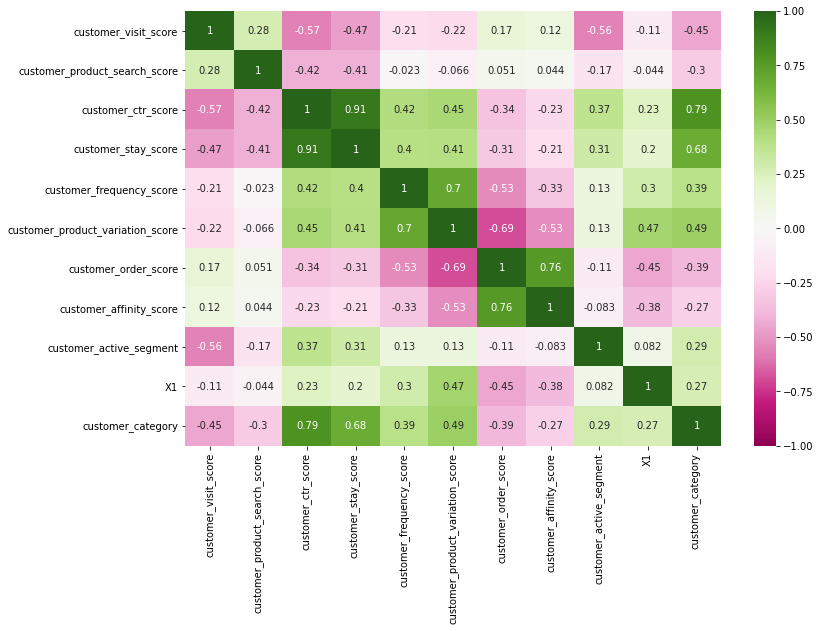

In [17]:
plt.figure(figsize=(12,8))
sns.heatmap(data.corr(), vmin=-1, vmax=1, center=0, cmap='PiYG', annot=True)

In [18]:
# There is a high correlation between ctr_score and stay_score 
# As we are using boosted tree method so we have to not thing about it bcz there are free from multicollinearity

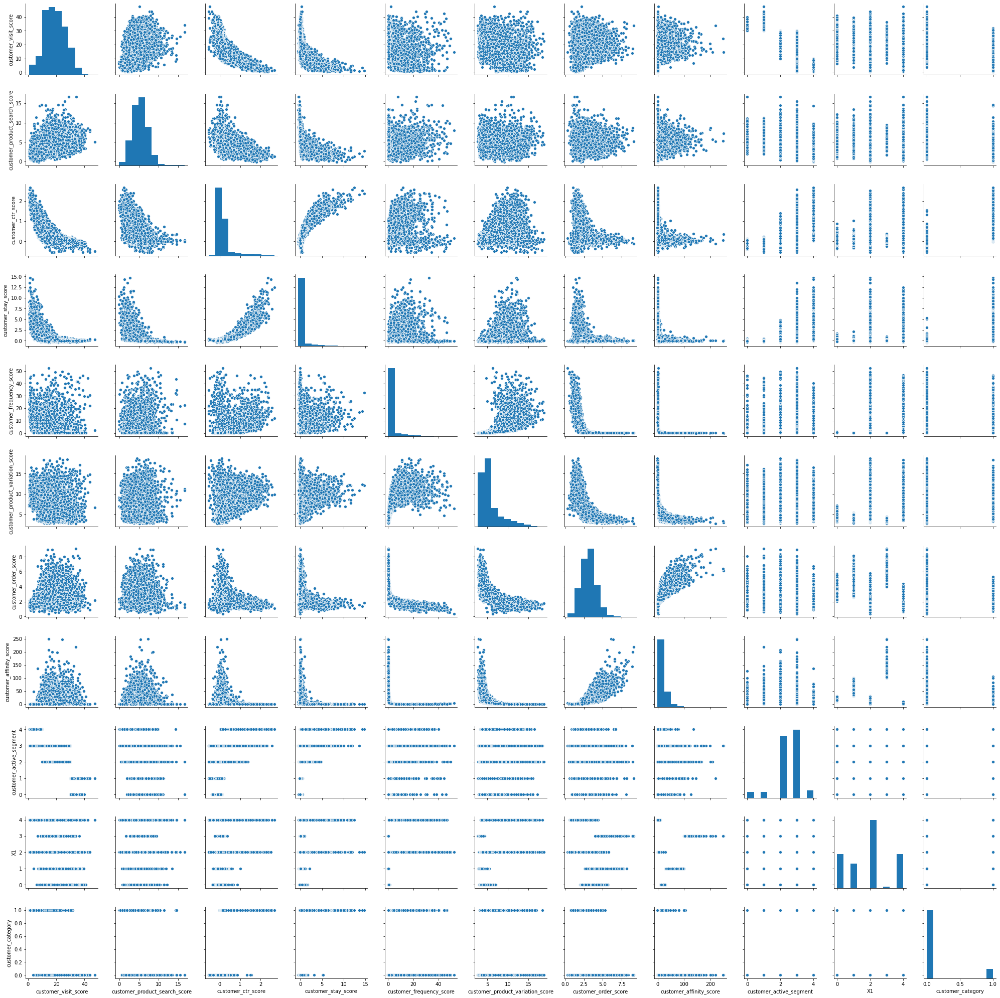

In [19]:
sns.pairplot(data)

In [20]:
ProfileReport(data)

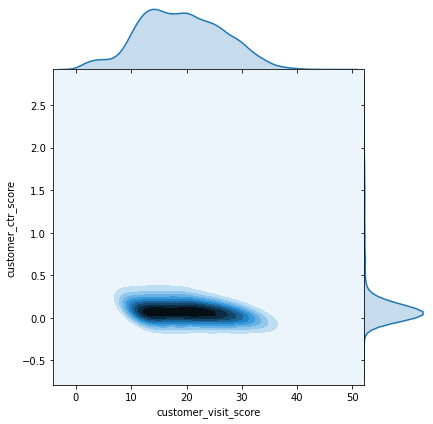

In [44]:
# Checking relation between customer vist score and customer category

sns.jointplot(x=data['customer_visit_score'], y=data['customer_ctr_score'], kind='kde', dropna=False, space=0.0)

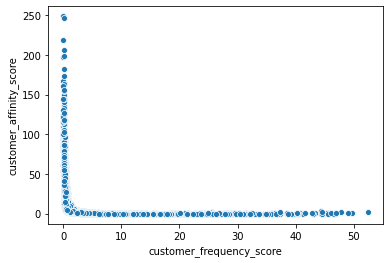

In [61]:
# Checking relation between customer frequency and affinity score
sns.scatterplot(data['customer_frequency_score'], data['customer_affinity_score'])

In [22]:
# Checking accuracy using imputer when weights is "Distance"
knn_distance_acc = []
for i in range(1,10):
    imputer = KNNImputer(n_neighbors=i, weights='distance', )
    impute_data = imputer.fit_transform(data)
    impute_data = pd.DataFrame(data=impute_data, columns=data.columns)
    
    X_train, X_test, y_train, y_test = train_test_split(
        impute_data.drop(labels='customer_category', axis=1),
        impute_data.customer_category, test_size=0.33, random_state=42)
    
    xgb = XGBClassifier()
    xgb.fit(X_train, y_train)
    pred = xgb.predict(X_test)
    
    knn_distance_acc.append(accuracy_score(y_test, pred))


In [23]:
# Checking accuracy using imputer when weights is "Unifrom"
knn_acc = []
for i in range(1,10):
    imputer = KNNImputer(n_neighbors=i, weights='uniform')
    impute_data = imputer.fit_transform(data)
    impute_data = pd.DataFrame(data=impute_data, columns=data.columns)
    
    X_train, X_test, y_train, y_test = train_test_split(
        impute_data.drop(labels='customer_category', axis=1), 
        impute_data.customer_category, test_size=0.33, random_state=42)
    
    xgb = XGBClassifier()
    xgb.fit(X_train, y_train)
    pred = xgb.predict(X_test)
    
    knn_acc.append(accuracy_score(y_test, pred))


Text(0, 0.5, 'Accuracy')

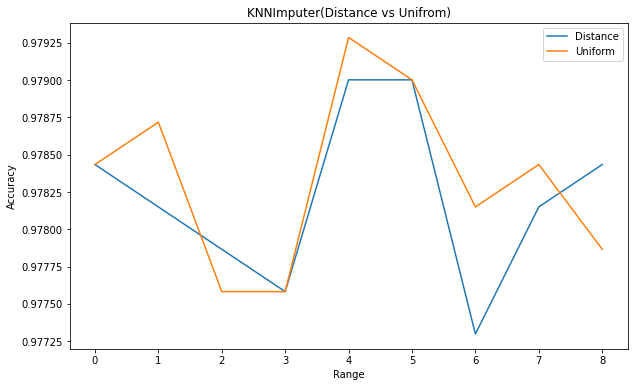

In [24]:
# Checking Difference in the accuracy score of both imputer by using plt.plot
plt.figure(figsize=(10,6))
plt.plot(knn_distance_acc, label='Distance')
plt.plot(knn_acc, label='Uniform')
plt.legend()
plt.legend()
plt.title('KNNImputer(Distance vs Unifrom)')
plt.xlabel('Range')
plt.ylabel('Accuracy')

In [25]:
# maximum accuracy is achieve with weights 'unifrom' with n_neighbours is'5'

In [26]:
imputer = KNNImputer(n_neighbors=5, weights='uniform')
impute_data = imputer.fit_transform(data)
impute_data = pd.DataFrame(data=impute_data, columns=data.columns)

In [27]:
# RepeatedSKFold for better splitting of training and testing sets
rskf = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)

# XGBClassifier used as its immune from multicollinearity and use 100 of ensemble tree to predict 
xgb = XGBClassifier(max_depth=7)

In [28]:
X, y = impute_data.drop(labels='customer_category', axis=1), impute_data.customer_category
score_list_without_nan = cross_val_score(estimator=xgb, X=X, y=y, cv=rskf.split(X,y))

In [29]:
X, y = data.drop('customer_category', axis=1), data.customer_category
score_list_nan = cross_val_score(estimator=xgb, X=X, y=y, cv=rskf.split(X,y))

Text(0, 0.5, 'Accuracy')

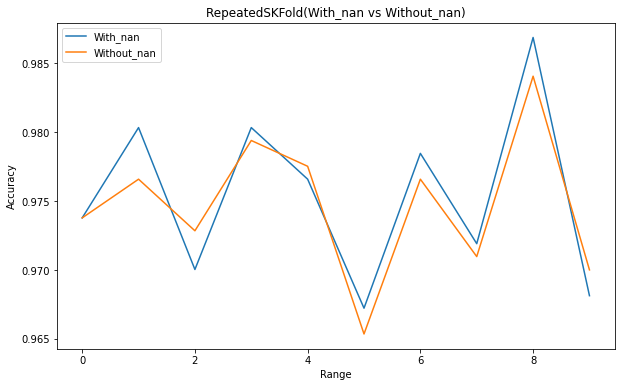

In [30]:
# Checking accuracy of model with data having "nan" value or without "nan" 
plt.figure(figsize=(10,6))
plt.plot(score_list_nan, label='With_nan')
plt.plot(score_list_without_nan, label='Without_nan')
plt.legend()
plt.legend()
plt.title('RepeatedSKFold(With_nan vs Without_nan)')
plt.xlabel('Range')
plt.ylabel('Accuracy')

In [31]:
# As the xgb alogrithm can be used with nan value it perform better on data with "nan" as those missing
# value contain some info about user

In [32]:
print('\nMaximum Accuracy:', max(score_list_nan)*100, '%') 
print('\nMinimum Accuracy:', min(score_list_nan)*100, '%') 
print('\nOverall Accuracy:', np.mean(score_list_nan)*100, '%') 
print('\nStandard Deviation:', np.std(score_list_nan)) 


Maximum Accuracy: 98.6879100281162 %

Minimum Accuracy: 96.72284644194757 %

Overall Accuracy: 97.53703196683621 %

Standard Deviation: 0.005953384484064203


In [201]:
df_test = pd.read_csv('test.csv')

In [202]:
df_test.head()

,customer_id,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_affinity_score,customer_active_segment,X1
0,csid_10739,22.500174,3.702145,0.118811,0.093253,0.689237,5.786842,3.748009,7.661716,B,BA
1,csid_10740,13.225950,3.600102,0.130985,0.053575,0.142756,3.940359,3.469659,33.999679,B,AA
2,csid_10741,14.603376,5.084047,-0.004651,-0.036299,0.333709,4.254662,3.855939,33.485630,B,AA
3,csid_10742,26.149905,3.025501,0.229740,0.204591,3.768405,6.942625,2.362421,0.795372,B,BA
4,csid_10743,19.810630,5.020400,-0.011347,-0.028780,0.286841,4.585513,3.278624,15.052058,C,BA


In [203]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7160 entries, 0 to 7159
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       7160 non-null   object 
 1   customer_visit_score              7160 non-null   float64
 2   customer_product_search_score     7131 non-null   float64
 3   customer_ctr_score                7160 non-null   float64
 4   customer_stay_score               7144 non-null   float64
 5   customer_frequency_score          7160 non-null   float64
 6   customer_product_variation_score  7117 non-null   float64
 7   customer_order_score              7119 non-null   float64
 8   customer_affinity_score           7160 non-null   float64
 9   customer_active_segment           7148 non-null   object 
 10  X1                                7135 non-null   object 
dtypes: float64(8), object(3)
memory usage: 615.4+ KB


In [204]:
df_test.nunique()

customer_id                         7160
customer_visit_score                7160
customer_product_search_score       7131
customer_ctr_score                  7160
customer_stay_score                 7144
customer_frequency_score            7160
customer_product_variation_score    7117
customer_order_score                7119
customer_affinity_score             7160
customer_active_segment                5
X1                                     5
dtype: int64

In [205]:
df_test.isna().sum()

customer_id                          0
customer_visit_score                 0
customer_product_search_score       29
customer_ctr_score                   0
customer_stay_score                 16
customer_frequency_score             0
customer_product_variation_score    43
customer_order_score                41
customer_affinity_score              0
customer_active_segment             12
X1                                  25
dtype: int64

In [206]:
# Converting Categorical df_test into numerical by using Ordinal Encoder

# First remove row with nan value from df_test for encoder and adding it later
temp_1 = df_test[df_test['customer_active_segment'].isna()]
df_test = df_test.drop(index=df_test[df_test['customer_active_segment'].isna()].index)

# Perfroming Ordinal encoding
Ordinal_1 = OrdinalEncoder()
df_test['customer_active_segment']=Ordinal_1.fit_transform(np.reshape(df_test['customer_active_segment'].values, (df_test.shape[0],1)))

# Adding row with nan value back to df_test
df_test = df_test.append(temp_1)

print(df_test.shape)

# First remove row with nan value from df_test for encoder and adding it later
temp_2 = df_test[df_test['X1'].isna()]
df_test = df_test.drop(index=df_test[df_test['X1'].isna()].index)

# Perfroming Ordinal encoding
Ordinal_2 = OrdinalEncoder()
df_test['X1']=Ordinal_2.fit_transform(np.reshape(df_test['X1'].values, (df_test.shape[0],1)))

# Adding row with nan value back to df_test
df_test = df_test.append(temp_2)

print(df_test.shape)

df_test.sort_index(inplace=True)

(7160, 11)
(7160, 11)


In [207]:
df_test.sort_index(inplace=True)

In [208]:
customer_id = df_test.customer_id

# Removing customer id has it have no use in prediction
df_test.drop('customer_id', axis=1, inplace=True)

In [209]:
# Fill missing value with np.nan for better impletation
df_test = df_test.fillna(value=np.nan)

In [210]:
# Train Model on 100% data
XGB = XGBClassifier(max_depth=7)
XGB.fit(data.drop('customer_category', axis=1), data.customer_category)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [211]:
df_test.shape

(7160, 10)

In [212]:
# Predicting 
result = XGB.predict(df_test)

In [213]:
# Save in mentioned form
result = pd.DataFrame(data=result,index=customer_id, columns=['customer_category'])
result.to_csv('result.csv')